<a href="https://colab.research.google.com/github/sarthakPatil96K/Multi-dog-breed-classification/blob/main/End_to_end_dog_breed_indentification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# End-to-end multi breed dog classificatoin
This notebook builds an end-to-end multi-class image classifier using TensorFlow and TensorFlow Hub.
## Problem
## Data
## Evaluation
## Features


In [ ]:
#!unzip "/content/drive/MyDrive/dog vision/dog-breed-identification.zip" -d "/content/drive/MyDrive/dog vision/"

### Get our workspace ready

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
print("TF version: ",tf.__version__)
print("TF hub version:",hub.__version__)
print("GPU","IS AVAILABLE (YES!!!!!)" if tf.config.list_physical_devices("GPU") else "Not available :(")

TF version:  2.18.0
TF hub version: 0.16.1
GPU Not available :(


## Getting our data ready.

In [ ]:
labels = pd.read_csv("/content/drive/MyDrive/dog vision/labels.csv")
print(labels.describe())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126


In [ ]:
labels.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
labels["breed"].value_counts()

,count
breed,
scottish_deerhound,126
maltese_dog,117
afghan_hound,116
entlebucher,115
bernese_mountain_dog,114
...,...
golden_retriever,67
komondor,67
brabancon_griffon,67


<Axes: xlabel='breed'>

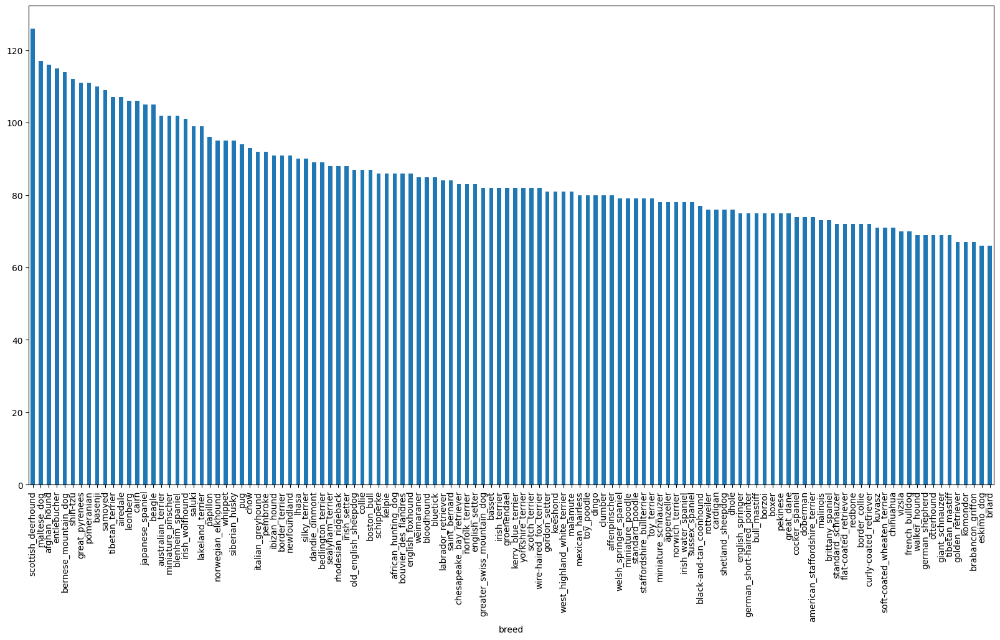

In [ ]:
labels["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels["breed"].value_counts().median()

82.0

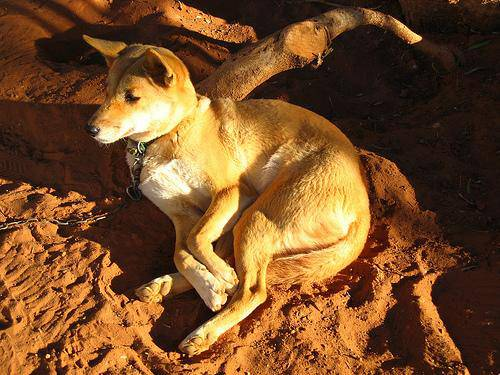

In [ ]:
from IPython.display import Image
#/content/drive/MyDrive/dog vision/train
Image("/content/drive/MyDrive/dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

## creating file path names and storing into a list

In [ ]:


filenames = ["/content/drive/MyDrive/dog vision/train/"+fname +".jpg"for fname in labels['id']]
filenames[:10]

['/content/drive/MyDrive/dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/dog vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/dog vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/dog vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
import os
if len(os.listdir("/content/drive/MyDrive/dog vision/train/"))==len(filenames):
  print("length matched")
else:
  print("Length did not matched")

length matched


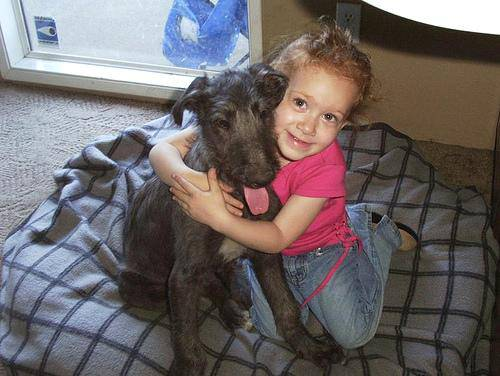

In [ ]:
Image(filenames[8463])

In [ ]:
labels['breed'][8463]

'scottish_deerhound'

let's prepare our labels

In [ ]:
label = labels['breed']
label = np.array(label)
label

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(label)

10222

In [ ]:
if len(filenames) == len(label):
  print("Length matched")
else :
  print("not matched")

Length matched


In [ ]:
unique_breeds = np.unique(label)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
len(unique_breeds)


120

In [ ]:
boolean_labels = [label == unique_breeds for label in label]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
 # x and y variables
 x = filenames
 y = boolean_labels

We're going to start off experimentign with 10000 images and increase as needed

In [ ]:
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:

# data splitting into test and validation sets
from sklearn.model_selection import train_test_split

# splitting data
x_train,x_valid,y_train,y_valid = train_test_split(x[:NUM_IMAGES],
                                                   y[:NUM_IMAGES],
                                                   test_size =0.2,
                                                   random_state = 42)
len(x_train),len(x_valid),len(y_train),len(y_valid)

(800, 200, 800, 200)

In [ ]:
x_train[:5],y_train[:2]

(['/content/drive/MyDrive/dog vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/dog vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/drive/MyDrive/dog vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/drive/MyDrive/dog vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  '/content/drive/MyDrive/dog vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         Fals

## Preprocessing images (into tensors)
To preprocess our images into Tensors we're going to write a function which does few things:
1. take an image filepath as input
2. use tensorFlow to read the file and save it to a variable, image
3. turn our image into tensors
4. resize the image to be ashape of (224,224)
5. return the modified image

array([[[ 97,  96,  91],
        [102, 101,  96],
        [108, 107, 102],
        ...,
        [ 10,  12,  11],
        [ 10,  12,  11],
        [ 10,  12,  11]],

       [[ 99,  98,  93],
        [102, 101,  96],
        [108, 107, 102],
        ...,
        [ 18,  20,  19],
        [ 18,  20,  19],
        [ 18,  20,  19]],

       [[ 99,  98,  93],
        [ 99,  98,  93],
        [102, 101,  96],
        ...,
        [  8,   8,   8],
        [  8,   8,   8],
        [  8,   8,   8]],

       ...,

       [[193, 192, 188],
        [194, 193, 189],
        [195, 194, 190],
        ...,
        [118, 117, 113],
        [130, 129, 127],
        [128, 127, 123]],

       [[199, 198, 194],
        [200, 199, 195],
        [201, 200, 196],
        ...,
        [116, 115, 110],
        [107, 106, 102],
        [108, 107, 102]],

       [[199, 198, 194],
        [200, 199, 195],
        [202, 201, 197],
        ...,
        [ 96,  96,  88],
        [ 93,  92,  87],
        [107, 107,  99]]], dtype=uint8)
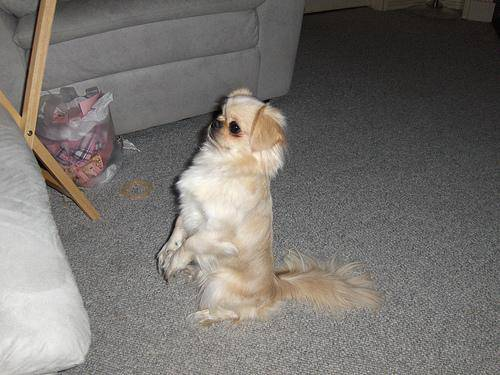

In [ ]:
Image(filenames[2])
from matplotlib.pyplot import imread
image =  imread(filenames[2])
image

In [187]:
IMG_SIZE = 224

def process_image(image_path):
    """
    Decodes an image file into a tensor and preprocesses it.
    Supports JPEG, PNG, and WebP automatically via tf.io.decode_image.
    """
    image = tf.io.read_file(image_path)
    image = tf.io.decode_image(image, channels=3, expand_animations=False)
    image = tf.image.convert_image_dtype(image, tf.float32)
    image = tf.image.resize(image, [IMG_SIZE, IMG_SIZE])
    return image


## Turning our data into batches.
Suggested size of one batch is 32

In [ ]:
# creating a simple function to return a tuple (image, label)
def get_image_data(image_path,label):

  image = process_image(image_path)
  return image, label

In [ ]:
get_image_data(x_train[1],y_train[1])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.18755254, 0.21500352, 0.24637607],
         [0.1764706 , 0.20050772, 0.23461136],
         [0.17305672, 0.18089986, 0.2279587 ],
         ...,
         [0.44908977, 0.5404238 , 0.43163532],
         [0.42711818, 0.5011202 , 0.43802518],
         [0.40852585, 0.4754201 , 0.43529415]],
 
        [[0.16093954, 0.18839052, 0.21976307],
         [0.15317924, 0.17825271, 0.21183819],
         [0.15481427, 0.16688253, 0.21182881],
         ...,
         [0.4626288 , 0.556939  , 0.4591917 ],
         [0.3884407 , 0.4678769 , 0.4117706 ],
         [0.36634105, 0.44199118, 0.40501416]],
 
        [[0.13412693, 0.16599749, 0.19985214],
         [0.13486801, 0.16027068, 0.19756654],
         [0.14402403, 0.15743439, 0.20170961],
         ...,
         [0.25783715, 0.36013055, 0.282312  ],
         [0.2909582 , 0.3830334 , 0.3436311 ],
         [0.30534175, 0.39550284, 0.37139183]],
 
        ...,
 
        [[0.5555578 , 0.67555076

In [185]:
BATCH_SIZE = 32

def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
    """
    Creates batches of data from images (x) and labels (y).
    - Shuffles data if training.
    - Doesn't shuffle if validation.
    - Accepts test data (no labels).
    """
    if test_data:
        print("Creating test data batches...")
        data = tf.data.Dataset.from_tensor_slices(tf.constant(x))  # Only filepaths
        data_batch = data.map(process_image).batch(batch_size).prefetch(tf.data.AUTOTUNE)
        return data_batch

    elif valid_data:
        print("Creating validation data batches...")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(x), tf.constant(y)))
        data_batch = data.map(get_image_data).batch(batch_size).prefetch(tf.data.AUTOTUNE)
        return data_batch

    else:
        print("Creating training data batches...")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(x), tf.constant(y)))
        data = data.shuffle(buffer_size=len(x))  # Shuffle before mapping
        data = data.map(get_image_data)
        data_batch = data.batch(batch_size).prefetch(tf.data.AUTOTUNE)
        return data_batch


In [ ]:

train_data = create_data_batches(x_train,y_train)
valid_data = create_data_batches(x_valid,y_valid,valid_data=True)

Creating trainging data batches...
creating test data batches...


In [ ]:
# checking different attributes of data batches
train_data.element_spec, valid_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## visualizing data batches


In [ ]:
def show_25_images(images,labels):
  """
  Display a plot of 25 images and their labels from a data batch.
  """
  plt.figure(figsize=(10,10))
  for i in range(25):
    ax =  plt.subplot(5,5,i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")

In [ ]:
train_images, train_labels =  next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[0.26159748, 0.3219266 , 0.20464884],
          [0.0515023 , 0.08133423, 0.04793088],
          [0.00774384, 0.00742871, 0.03498239],
          ...,
          [0.9958696 , 0.9958696 , 0.98802644],
          [0.99867827, 0.99867827, 0.99867827],
          [0.99867827, 0.99867827, 0.99867827]],
 
         [[0.55311126, 0.61336964, 0.4891823 ],
          [0.01831933, 0.04813797, 0.011395  ],
          [0.05999469, 0.05972333, 0.09033784],
          ...,
          [0.99964464, 0.99964464, 0.99180156],
          [0.9921132 , 0.9921132 , 0.9921132 ],
          [0.9921132 , 0.9921132 , 0.9921132 ]],
 
         [[0.32849273, 0.38042086, 0.26618412],
          [0.38001338, 0.41093427, 0.3661758 ],
          [0.16323976, 0.16684623, 0.18323566],
          ...,
          [0.9936071 , 0.9936071 , 0.98576397],
          [0.98823535, 0.98823535, 0.98823535],
          [0.98823535, 0.98823535, 0.98823535]],
 
         ...,
 
         [[0.7676883 , 0.96691257, 0.8002831 ],
          [0.83024

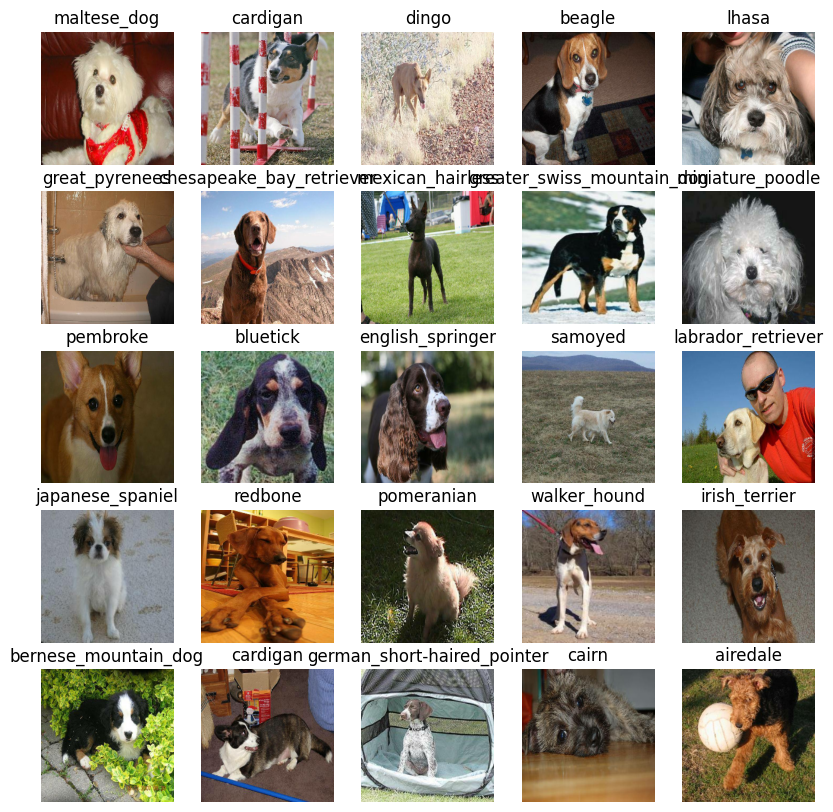

In [ ]:




train_images, train_labels =  next(train_data.as_numpy_iterator())

show_25_images(train_images,train_labels)

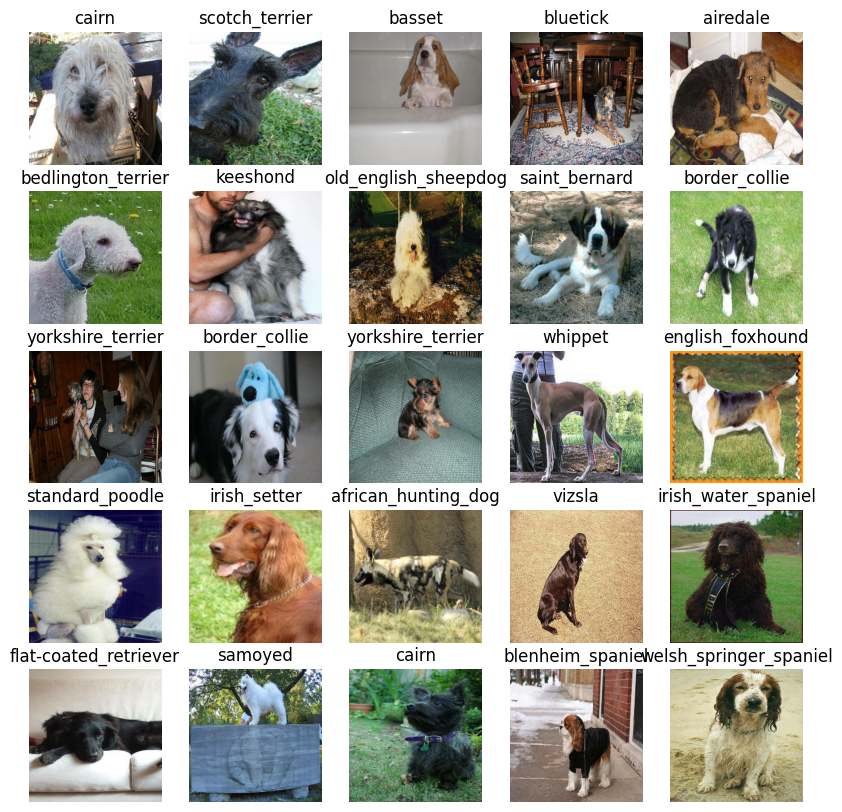

In [ ]:
val_images, val_labels =  next(valid_data.as_numpy_iterator())

show_25_images(val_images,val_labels)

## Building the model

In [ ]:
# # Setup input shape to the model
# INPUT_SHAPE = [None,IMG_SIZE,IMG_SIZE,3]

# # Setup output shape of our model
# OUTPUT_SHAPE = len(unique_breeds)

# # Setup model URL from TensorFlow Hub
# MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/feature_vector/4"

# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]  # Make sure IMG_SIZE is defined (should be 224 for this model)

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)  # Make sure unique_breeds is defined

# Setup model URL from TensorFlow Hub
# Using the latest recommended version from the TensorFlow Hub documentation
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/feature_vector/5"

now we've got our inputs, outputs, and model ready to go.

In [ ]:
 def create_model():
    print("Building MobileNetV2 model with fixed architecture")

    # Model parameters
    INPUT_SHAPE = (224, 224, 3)  # Must match model expectations
    OUTPUT_SHAPE = 120            # Number of classes

    # Option 1: Use the official Keras application (recommended)
    base_model = tf.keras.applications.MobileNetV2(
        input_shape=INPUT_SHAPE,
        include_top=False,
        weights='imagenet'
    )
    base_model.trainable = False

    # Option 2: If you specifically need the TF Hub version
    # model_url = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"
    # base_model = hub.KerasLayer(model_url, input_shape=INPUT_SHAPE, trainable=False)

    # Build model
    model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_shape=INPUT_SHAPE),
        base_model,
        tf.keras.layers.GlobalAveragePooling2D(),
        tf.keras.layers.Dense(OUTPUT_SHAPE, activation='softmax')
    ])

    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
        loss=tf.keras.losses.CategoricalCrossentropy(),
        metrics=['accuracy']
    )

    return model

# Create and verify model
model = create_model()
model.summary()

Building MobileNetV2 model with fixed architecture
9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/input_layer.py:27: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 120)            │       153,720 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,411,704 (9.20 MB)

 Trainable params: 153,720 (600.47 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

## ceating callbacks
TensorBoard Callback
1. load the tensorboard notebook extension
2. Create a tensorboard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our models training logs with `%tensorboard` magic function after training model

In [ ]:
# load tensorboard notebook extension
%load_ext tensorboard

In [ ]:
import datetime
# create a function to build a tensorboard callback
def create_tensorboar_callback():
  """

  """
  logdir = os.path.join("/content/drive/MyDrive/dog vision/logs",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping callback

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model (on subset of data)

In [ ]:
NUM_EPOCHS =  100 #@param {type:"slider", min:10, max:100, step:10}

Function to train the model

In [ ]:
def train_model():
  """
  Train a given model and return s the trained version.
  """
  model = create_model()
  tensorboard = create_tensorboar_callback()
  model.fit(x=train_data,
            epochs = NUM_EPOCHS,
            validation_data = valid_data,
            validation_freq = 1,
            callbacks=[tensorboard,early_stopping])
  return model

In [ ]:
model = train_model()

Building MobileNetV2 model with fixed architecture
Epoch 1/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 328s 13s/step - accuracy: 0.0505 - loss: 4.8694 - val_accuracy: 0.2100 - val_loss: 3.6863
Epoch 2/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 106s 2s/step - accuracy: 0.6074 - loss: 2.1682 - val_accuracy: 0.4750 - val_loss: 2.5249
Epoch 3/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 81s 2s/step - accuracy: 0.9061 - loss: 0.9528 - val_accuracy: 0.5500 - val_loss: 1.9960
Epoch 4/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 47s 2s/step - accuracy: 0.9523 - loss: 0.5143 - val_accuracy: 0.5750 - val_loss: 1.8006
Epoch 5/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 82s 2s/step - accuracy: 0.9976 - loss: 0.2931 - val_accuracy: 0.5700 - val_loss: 1.7031
Epoch 6/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 80s 2s/step - accuracy: 0.9991 - loss: 0.2059 - val_accuracy: 0.5850 - val_loss: 1.6501
Epoch 7/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 84s 2s/step - accuracy: 0.9997 - loss: 0.1419 - val_accuracy: 0.5800 - val_loss: 1.6209
Epoch 8/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 82s 2s/step - accu

### Checking the TensorBoard logs

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/dog\ vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
predictions = model.predict(valid_data,verbose=1)
predictions

7/7 ━━━━━━━━━━━━━━━━━━━━ 13s 2s/step


array([[6.7677593e-04, 1.8654850e-03, 8.9114634e-05, ..., 5.2203709e-04,
        1.4255500e-04, 5.0979876e-03],
       [3.1571934e-04, 7.0840929e-04, 3.5062900e-03, ..., 6.9349277e-05,
        2.1375814e-03, 1.8436190e-04],
       [1.2635083e-04, 1.9752055e-03, 1.9217387e-04, ..., 1.5370143e-04,
        5.2795582e-05, 2.0612422e-03],
       ...,
       [1.2693435e-04, 4.2659204e-04, 1.3258099e-04, ..., 2.1072954e-04,
        5.8219008e-05, 2.0765468e-04],
       [9.2044316e-04, 5.5653654e-05, 9.9796394e-05, ..., 4.9297520e-05,
        1.2353634e-05, 5.2748313e-03],
       [1.9710934e-04, 7.3383535e-06, 3.5752414e-04, ..., 9.3252043e-04,
        1.4151544e-04, 5.8439735e-04]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
# First prediction
label=1
print(f"Max value (probability of prediction): {np.max(predictions[label])}")
print(f"Sum: {np.sum(predictions[label])}")
print(f"Max index: {np.argmax(predictions[label])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[label])]}")

Max value (probability of prediction): 0.5499536395072937
Sum: 1.0000001192092896
Max index: 57
Predicted label: irish_terrier


In [ ]:
# Turning prediction probabilities into their respective label
def get_pred_label(prediction_probabilities):
  """
  """
  return unique_breeds[np.argmax(prediction_probabilities)]
pred_label = get_pred_label(predictions[1])
pred_label

'irish_terrier'

In [ ]:
def unbatch(data):
  images_ = []
  labels_ = []
  for image,label in data.unbatch().as_numpy_iterator():
    images_.append(image)
    labels_.append(unique_breeds[np.argmax(label)])
  return images_,labels_
val_img,val_lab = unbatch(valid_data)
val_img[0],val_lab[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1, ax=None):
    """
    Displays the image with predicted and true label titles.
    """
    pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
    pred_label = get_pred_label(pred_prob)

    if ax is None:
        ax = plt.gca()

    ax.imshow(image)
    ax.axis("off")

    # Title color depending on correctness
    color = "green" if pred_label == true_label else "red"
    ax.set_title(
        f"Prediction: {pred_label}, model_confidence: {round(np.max(pred_prob)*100)}%\nTrue label: {true_label}",
        color=color,
        fontsize=10
    )


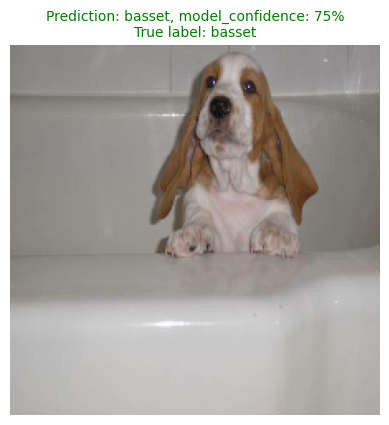

In [ ]:
plot_pred(prediction_probabilities=predictions, labels = val_lab, images = val_img,n=2)

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, unique_breeds, n=1, ax=None):
    """
    Plots top 10 predicted labels and highlights true and predicted ones.
    """
    pred_prob = prediction_probabilities[n]
    true_label = labels[n]

    # Get top 10 prediction indices (highest confidence)
    top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
    model_confidence = pred_prob[top_10_pred_indexes]
    pred_labels = [unique_breeds[i] for i in top_10_pred_indexes]

    # Get top predicted label using your function
    top_pred_label = get_pred_label(pred_prob)

    if ax is None:
        ax = plt.gca()

    bars = ax.bar(np.arange(10), model_confidence, color="grey")
    ax.set_xticks(np.arange(10))
    ax.set_xticklabels(pred_labels, rotation="vertical", fontsize=8)
    ax.set_ylabel("Model Confidence")
    ax.set_title("Top 10 Predictions", fontsize=10)

    # Highlight top prediction (blue)
    for i, label in enumerate(pred_labels):
        if label == top_pred_label:
            bars[i].set_color("blue")
            break

    # Highlight true label (green)
    for i, label in enumerate(pred_labels):
        if label == true_label:
            bars[i].set_color("green")


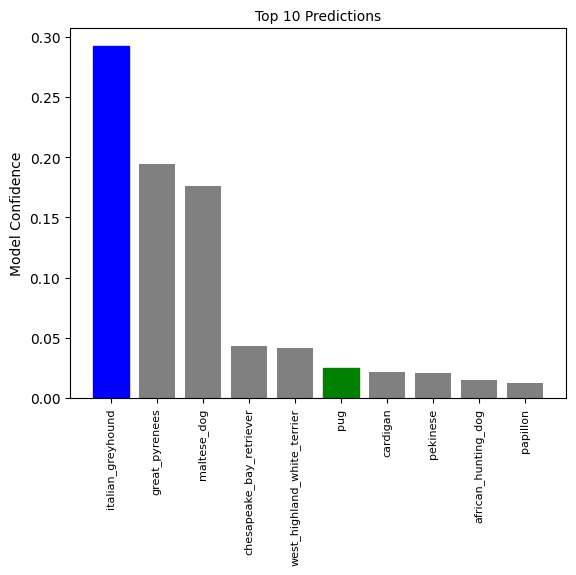

In [ ]:
plot_pred_conf(prediction_probabilities = predictions,
               labels = val_lab,
               unique_breeds=unique_breeds,
               n=80)

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

def plot_grid_with_preds(predictions, val_lab, val_img, unique_breeds, i_multiplier=0, num_rows=3, num_cols=2):
    num_images = num_rows * num_cols
    fig = plt.figure(figsize=(16, num_rows * 5))
    gs = gridspec.GridSpec(num_rows, 2 * num_cols, figure=fig)

    for i in range(num_images):
        index = i + i_multiplier

        # Left: Image
        ax_img = fig.add_subplot(gs[i // num_cols, (i % num_cols) * 2])
        plot_pred(prediction_probabilities=predictions,
                  labels=val_lab,
                  images=val_img,
                  n=index,
                  ax=ax_img)

        # Right: Bar chart
        ax_conf = fig.add_subplot(gs[i // num_cols, (i % num_cols) * 2 + 1])
        plot_pred_conf(prediction_probabilities=predictions,
                       labels=val_lab,
                       unique_breeds=unique_breeds,
                       n=index,
                       ax=ax_conf)

    plt.tight_layout()
    plt.show()


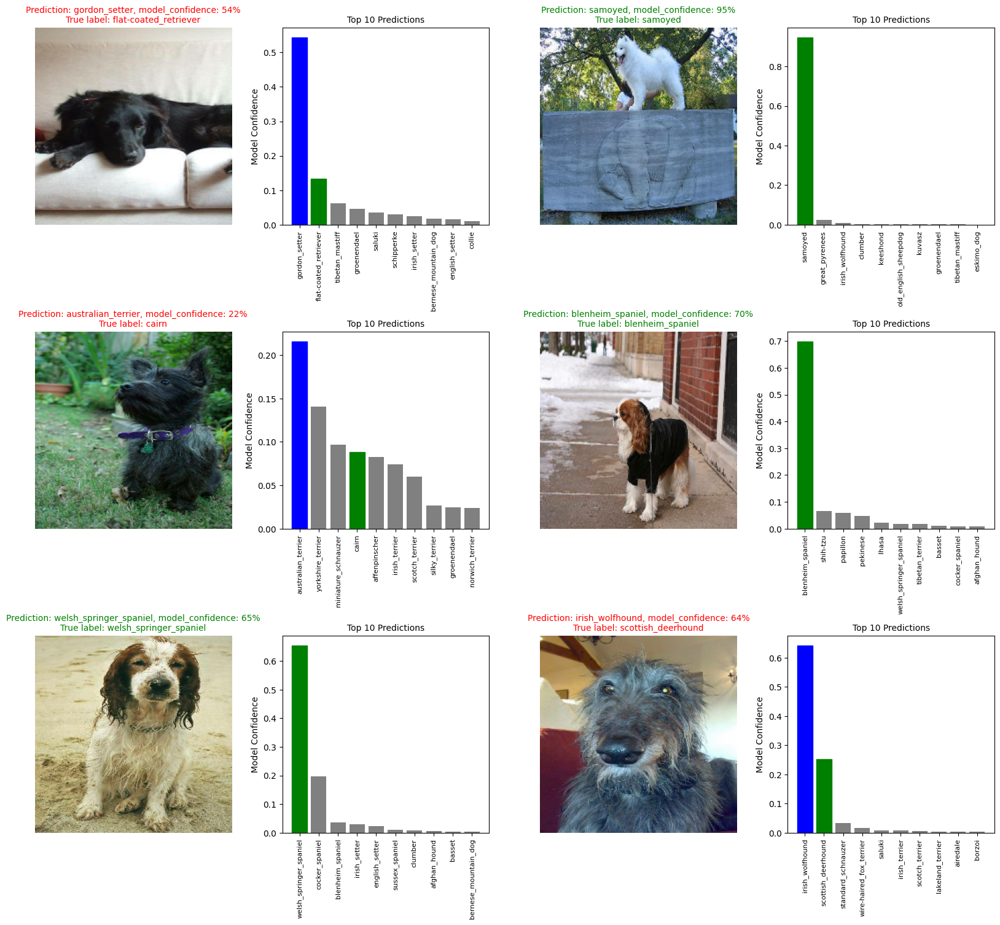

In [ ]:
plot_grid_with_preds(predictions=predictions, val_lab=val_lab, val_img=val_img, unique_breeds=unique_breeds,i_multiplier=20)

## Saving the current state of model

In [ ]:
# Create a functo to save a model
def save_model(model,suffix=None):
  """
  """
  modeldir = os.path.join("/content/drive/MyDrive/dog vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path = modeldir + "-" + suffix + ".h5"
  print(f"Savign model to: {model_path}...")
  model.save(model_path)
  return model_path


In [ ]:
#Create a functio to load a model
def load_model(model_path):
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
# Save our model which is trained on 1000 images
save_model(model,suffix="1000-images-mobilenetv2-adam")

Savign model to: /content/drive/MyDrive/dog vision/models/20250727-143929-1000-images-mobilenetv2-adam.h5...


'/content/drive/MyDrive/dog vision/models/20250727-143929-1000-images-mobilenetv2-adam.h5'

In [ ]:
loaded_model_1000 = load_model("/content/drive/MyDrive/dog vision/models/20250727-143929-1000-images-mobilenetv2-adam.h5")

Loading saved model from: /content/drive/MyDrive/dog vision/models/20250727-143929-1000-images-mobilenetv2-adam.h5


In [ ]:
loaded_model_1000.evaluate(valid_data)

7/7 ━━━━━━━━━━━━━━━━━━━━ 13s 1s/step - accuracy: 0.6002 - loss: 1.5061


[1.5447251796722412, 0.5899999737739563]

In [ ]:
import tensorflow as tf
tf.config.list_physical_devices('GPU')


[]

In [ ]:
!nvidia-smi


/bin/bash: line 1: nvidia-smi: command not found


##Training the model on entire dataset

In [ ]:
len(x),len(y)

(10222, 10222)

In [ ]:
full_data = create_data_batches(x,y)

Creating trainging data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
full_model = create_model()

Building MobileNetV2 model with fixed architecture


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/input_layer.py:27: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboar_callback()
# No validation set when trainining on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)



In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,full_model_early_stopping])

Epoch 1/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 473s 1s/step - accuracy: 0.4527 - loss: 2.4782
Epoch 2/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 484s 1s/step - accuracy: 0.8354 - loss: 0.5806
Epoch 3/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 446s 1s/step - accuracy: 0.9009 - loss: 0.3702
Epoch 4/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 503s 1s/step - accuracy: 0.9453 - loss: 0.2477
Epoch 5/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 513s 1s/step - accuracy: 0.9706 - loss: 0.1756
Epoch 6/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 456s 1s/step - accuracy: 0.9840 - loss: 0.1286
Epoch 7/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 502s 1s/step - accuracy: 0.9920 - loss: 0.0962
Epoch 8/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 497s 1s/step - accuracy: 0.9943 - loss: 0.0758
Epoch 9/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 504s 1s/step - accuracy: 0.9966 - loss: 0.0618
Epoch 10/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 503s 1s/step - accuracy: 0.9983 - loss: 0.0494
Epoch 11/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 493s 1s/step - accuracy: 0.9992 - loss: 0.0390
Epoch 12/100
320/320 ━━━━━━━━━

In [ ]:
import os
print("CPU cores available:", os.cpu_count())


CPU cores available: 2


In [ ]:
save_model(full_model,suffix="full-dataset-mobilenetv2-adam")

Savign model to: /content/drive/MyDrive/dog vision/models/20250727-173624-full-dataset-mobilenetv2-adam.h5...


'/content/drive/MyDrive/dog vision/models/20250727-173624-full-dataset-mobilenetv2-adam.h5'

In [ ]:
# Loading fully trained model
full_model = load_model("/content/drive/MyDrive/dog vision/models/20250727-173624-full-dataset-mobilenetv2-adam.h5")

Loading saved model from: /content/drive/MyDrive/dog vision/models/20250727-173624-full-dataset-mobilenetv2-adam.h5


Making predictions on the test dataset of kaggle

In [166]:
img_path = "/content/drive/MyDrive/dog vision/test/"
test_filenames = [img_path+filename for filename in os.listdir(img_path)]
test_filenames[:10]

['/content/drive/MyDrive/dog vision/test/e64b53f9c0fefdd97e269c55335418e7.jpg',
 '/content/drive/MyDrive/dog vision/test/e5507ebc0e05513bf543e160a484666f.jpg',
 '/content/drive/MyDrive/dog vision/test/ddd7f84a932ec7213b9c1f6de8c09262.jpg',
 '/content/drive/MyDrive/dog vision/test/e1cad2c1658b4a81db4750218a1f57d2.jpg',
 '/content/drive/MyDrive/dog vision/test/e596c0d97b381e876d46dda2eb60074c.jpg',
 '/content/drive/MyDrive/dog vision/test/e7ed96b272013c6de9505a753816ce75.jpg',
 '/content/drive/MyDrive/dog vision/test/dd1c29ac3307205b4088ca255ea53919.jpg',
 '/content/drive/MyDrive/dog vision/test/df0063da2179d3ac623296f2c164aeb6.jpg',
 '/content/drive/MyDrive/dog vision/test/def88eeacc633cbc3d46d5f5fb495379.jpg',
 '/content/drive/MyDrive/dog vision/test/e6ed62f411426a4f7e26e6ccdbaf7ecc.jpg']

In [167]:
len(test_filenames)

10357

In [168]:
# creating test data batches
test_data = create_data_batches(test_filenames,test_data=True)

creating test data batches...


In [169]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
test_predictions = full_model.predict(test_data,verbose=1)

## Making predictions on my own Dog images

In [193]:
custom_path = "drive/MyDrive/dog vision/own_dog_images/"
custom_filenames = [custom_path+filename for filename in os.listdir(custom_path)]
custom_filenames[:10]
custom_filenames.remove(custom_filenames[1])
custom_filenames

['drive/MyDrive/dog vision/own_dog_images/Bulldog_inglese.jpg',
 'drive/MyDrive/dog vision/own_dog_images/poodle.jpeg',
 'drive/MyDrive/dog vision/own_dog_images/500px-Bullterrier-3453301920.jpg']

In [194]:
custom_batch = create_data_batches(custom_filenames,test_data=True)


Creating test data batches...


In [195]:
custom_batch

<_PrefetchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [196]:
preds = full_model.predict(custom_batch)

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


In [198]:
preds

array([[3.14309490e-09, 1.02918542e-10, 3.14889004e-10, 2.47927034e-09,
        1.85585860e-03, 1.25721954e-05, 8.98172470e-09, 1.81542302e-04,
        1.75281443e-07, 5.99437300e-08, 1.03964271e-09, 3.78293343e-08,
        1.13828350e-10, 1.58683531e-06, 1.62908066e-07, 2.88766766e-09,
        4.32280302e-07, 2.20574083e-08, 3.88323542e-08, 1.34401344e-04,
        3.72001097e-08, 9.77572054e-03, 2.40778013e-06, 1.36356391e-06,
        8.06375738e-06, 9.78743255e-01, 4.64147343e-09, 4.12258032e-08,
        2.56667278e-07, 9.34212139e-08, 1.38582959e-06, 1.40487305e-06,
        3.91185168e-10, 3.43942065e-06, 1.96623198e-08, 1.48047468e-08,
        2.15260734e-08, 4.80370481e-08, 1.74625453e-10, 4.40186022e-06,
        1.57497730e-08, 2.25363706e-07, 2.18376357e-08, 2.24329210e-06,
        1.23216448e-09, 2.62533198e-03, 6.03720018e-10, 1.20204697e-06,
        3.68097979e-08, 1.81202395e-08, 7.62346852e-11, 5.58793836e-04,
        1.24006633e-07, 7.99829991e-07, 5.85629536e-08, 9.478300

In [199]:
# Getting prediction labels
pred_labels = [get_pred_label(pred) for pred in preds]
pred_labels

['bull_mastiff', 'brabancon_griffon', 'ibizan_hound']